<a href="https://colab.research.google.com/github/diana-pica/Fabric-Defect-Recognition-using-Deep-Learning/blob/main/Licenta_Pica_Diana.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# `Libraries installation`

In [ ]:
!pip install matplotlib


In [ ]:
!pip install tensorflow opencv-python numpy

In [ ]:
!pip install tensorflow tensorflow-object-detection-api


ERROR: Operation cancelled by user


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 98.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [ ]:
!pip uninstall -y tensorflow
!pip install tensorflow==2.14.0


  Using cached tensorflow-2.14.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.1 kB)
Using cached tensorflow-2.14.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (489.9 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-text 2.18.1 requires tensorflow<2.19,>=2.18.0, but you have tensorflow 2.14.0 which is incompatible.
tf-keras 2.18.0 requires tensorflow<2.19,>=2.18, but you have tensorflow 2.14.0 which is incompatible.


# Importing libraries

In [ ]:
import os
from ultralytics import YOLO
import re
import random
from PIL import Image, ImageOps, ImageEnhance
import numpy as np
import shutil
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Rescaling
from keras.optimizers import SGD
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras.preprocessing.image import img_to_array, load_img
from keras.utils import Sequence
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import SGD
import tensorflow as tf
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras import backend as K
from keras.models import load_model
from ipywidgets import interact

# Dataset work

Connecting to drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Augmentation of the database and labels editing

In [ ]:
def augment_images_and_labels():
    images_folder_path = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/images"  # The folder with our initial images from the dataset
    labels_folder_path = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/labels"  # The folder with our initial labels from the dataset
    output_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented"  # Temporary folder where the images and the labels will be put after creation
    os.makedirs(output_folder, exist_ok=True)

    # My images are divided in 9 folders made by different cameras and different materials, each of them are named typeXcamY and had 2 subfolder with the "good" images and one with "anomaly"in them(can be one or multiple)
    for root, dirs, files in os.walk(images_folder_path):
        if re.search(r"type\d+cam\d+/test/(good|anomaly)", root):
            folder_type = "good" if "good" in root else "anomaly"
            type_cam = re.search(r"type\d+cam\d+", root).group(0)
            print(f"Processing folder: {root} (Type: {type_cam}, Category: {folder_type})")

            # My labels folder is identical with the image foler, so we will repeatthe same procedure as for imaes
            label_root = root.replace(images_folder_path, labels_folder_path)

            # I made 2 folders to divide the augmentations in the one which will go to expand the training folder and the one which will go for the validation folder and they are defined below
            output_type_cam = os.path.join(output_folder, type_cam)
            first_two_folder = os.path.join(output_type_cam, "first_two_augmentations", folder_type)
            third_folder = os.path.join(output_type_cam, "third_augmentation", folder_type)
            os.makedirs(first_two_folder, exist_ok=True)
            os.makedirs(third_folder, exist_ok=True)

            # Load images and corresponding labels
            images = [os.path.join(root, file) for file in files if file.endswith(".jpg")]
            labels = [os.path.join(label_root, file) for file in os.listdir(label_root) if file.endswith(".txt")]
            print(f"Found {len(images)} images and {len(labels)} labels in {root}.")

            # Process and augment images and their labels
            process_images_and_labels(images, labels, first_two_folder, third_folder)

def random_augmentation(image):
    transformations = [
        ("FLIP_LEFT_RIGHT", Image.FLIP_LEFT_RIGHT),
        ("FLIP_TOP_BOTTOM", Image.FLIP_TOP_BOTTOM),
        ("ROTATE_90", Image.ROTATE_90),
        ("ROTATE_180", Image.ROTATE_180),
        ("ROTATE_270", Image.ROTATE_270)
    ]
    transformation_name, transformation = random.choice(transformations)
    return image.transpose(transformation), transformation_name

def adjust_bounding_boxes(bboxes, transformation_name, img_width, img_height):
      adjusted_bboxes = []
      for bbox in bboxes:
          x_center, y_center, width, height = bbox

          if transformation_name == "FLIP_LEFT_RIGHT":
              x_center = 1 - x_center  # Flip horizontally

          elif transformation_name == "FLIP_TOP_BOTTOM":
              y_center = 1 - y_center  # Flip vertically

          elif transformation_name == "ROTATE_90":
              x_center, y_center = y_center, 1 - x_center  # Rotate 90 degrees
              width, height = height, width

          elif transformation_name == "ROTATE_180":
              x_center, y_center = 1 - x_center, 1 - y_center  # Rotate 180 degrees

          elif transformation_name == "ROTATE_270":
              x_center, y_center = 1 - y_center, x_center  # Rotate 270 degrees
              width, height = height, width

          # Append the adjusted bounding box
          adjusted_bboxes.append([x_center, y_center, width, height])

      return adjusted_bboxes

def process_images_and_labels(image_paths, label_paths, first_two_folder, third_folder, num_augmentations=3):
    for img_path in image_paths:
        # Match the label file with the image by replacing the file extension
        label_path = os.path.join(os.path.dirname(label_paths[0]), os.path.basename(img_path).replace(".jpg", ".txt"))
        if not os.path.exists(label_path):
            print(f"Label missing for {img_path}, skipping.")
            continue

        try:
            img = Image.open(img_path)
            img_width, img_height = img.size

            # Read the label file
            with open(label_path, "r") as f:
                lines = f.readlines()
                bboxes = [[float(x) for x in line.strip().split()[1:]] for line in lines]
                classes = [int(line.strip().split()[0]) for line in lines]

            for i in range(num_augmentations):
                augmented_img, transformation_name = random_augmentation(img.copy())
                adjusted_bboxes = adjust_bounding_boxes(bboxes, transformation_name, img_width, img_height)

                # Save the augmented image
                if i < 2:  # Save first two augmentations
                    save_img_folder = first_two_folder
                else:  # Save the third augmentation
                    save_img_folder = third_folder

                save_img_name = f"{transformation_name}_aug_{i}_{os.path.basename(img_path)}"
                save_label_name = f"{transformation_name}_aug_{i}_{os.path.basename(label_path)}"

                save_img_path = os.path.join(save_img_folder, save_img_name)
                save_label_path = os.path.join(save_img_folder, save_label_name)
                augmented_img.save(save_img_path)

                # Save the new labels for the augmented image
                with open(save_label_path, "w") as f:
                    for cls, bbox in zip(classes, adjusted_bboxes):
                        f.write(f"{cls} {' '.join(map(str, bbox))}\n")

                print(f"Saved augmented image: {save_img_path} and new label: {save_label_path}")
        except Exception as e:
            print(f"Error processing {img_path} and {label_path}: {e}")
augment_images_and_labels()


Processing folder: /content/gdrive/MyDrive/Colab Notebooks/newdataset/images/type2cam2/test/good (Type: type2cam2, Category: good)
Found 19 images and 19 labels in /content/gdrive/MyDrive/Colab Notebooks/newdataset/images/type2cam2/test/good.
Saved augmented image: /content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented/type2cam2/first_two_augmentations/good/FLIP_TOP_BOTTOM_aug_0_102_png.rf.f13ec2e69e5f37df95b7099744851566.jpg and new label: /content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented/type2cam2/first_two_augmentations/good/FLIP_TOP_BOTTOM_aug_0_102_png.rf.f13ec2e69e5f37df95b7099744851566.txt
Saved augmented image: /content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented/type2cam2/first_two_augmentations/good/FLIP_TOP_BOTTOM_aug_1_102_png.rf.f13ec2e69e5f37df95b7099744851566.jpg and new label: /content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented/type2cam2/first_two_augmentations/good/FLIP_TOP_BOTTOM_aug_1_102_png.rf.f13ec2e69e5f37df95b7099744851566.txt
S

Deletion of possible content of train and validation folder

In [ ]:
#I made this block in case of me wanting  new augmented images in the dataset, the augmented images and labels don't have a folder so the code is processing all the images which are outside of a subfolder
def delete_augmented_files(folders, skipped_subfolders):

    for folder in folders:
        print(f"Processing base path: {folder}")
        for root, dirs, files in os.walk(folder):
            # Check if the current folder is not an assigned folder
            if not any(skipped_subfolders in root for skipped_subfolders in skipped_subfolders):
                print(f"Processing folder: {root}")

                # Delete any .jpg or .txt files in unassigned folders
                for file in files:
                    if file.endswith(".jpg") or file.endswith(".txt"):
                        file_path = os.path.join(root, file)
                        os.remove(file_path)
                        print(f"Deleted: {file_path}")

# Lst of folders which need to be processed
folders = [
    "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/train",
    "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train",
    "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/val",
    "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/val"
    "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test"

]

# List of skipped subfolders
skipped_subfolders = [
    "type1cam1",
    "type2cam2",
    "type3cam1",
    "type5cam2",
    "type6cam2",
    "type7cam2",
    "type8cam1",
    "type9cam2",
    "type10cam2"
]

# Run the cleanup for multiple base paths
delete_augmented_files(folders, skipped_subfolders)

Processing base path: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/train
Processing folder: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/train
Processing base path: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train
Processing folder: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train
Deleted: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train/ROTATE_270_aug_1_73412_png.rf.d840f994b14396a3a8fbbf199648b78f.txt
Deleted: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train/ROTATE_90_aug_0_76470_png.rf.e9684a7e6ea40e90e3561072af257af4.txt
Deleted: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train/ROTATE_270_aug_1_76470_png.rf.e9684a7e6ea40e90e3561072af257af4.txt
Deleted: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train/FLIP_LEFT_RIGHT_aug_0_76445_png.rf.3bd8602381da8dadc8e686632bc9e1cf.txt
Deleted: /content/gdrive/MyDrive/Colab Notebooks/newdatase

Movement of the augmented images and labels to the training and validation database

In [ ]:
def dataset_organisation(augmented_path, label_path, image_path, augmentation_pattern):

    for root, dirs, files in os.walk(augmented_path):
        if re.search(rf"type\d+cam\d+/{augmentation_pattern}/(good|anomaly)", root):
            print(f"Processing folder: {root}")

            # Transfer files into respective folders
            for file in files:
                source = os.path.join(root, file)
                if file.endswith(".jpg"):  # Image files
                    destination = os.path.join(image_path, file)
                    shutil.move(source, destination)
                    print(f"Moved image: {source} -> {destination}")
                elif file.endswith(".txt"):  # Label files
                    destination = os.path.join(label_path, file)
                    shutil.move(source, destination)
                    print(f"Moved label: {source} -> {destination}")

# Augmented images and labels folder
augmented_path = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented"

# Adding images and labels in the train folders
label_path_train = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train"
image_path_train = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/train"
dataset_organisation(augmented_path, label_path_train, image_path_train, "first_two_augmentations")

# Adding images and labels in the val folders
label_path_val = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/val"
image_path_val = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/val"
dataset_organisation(augmented_path, label_path_val, image_path_val, "third_augmentation")


Datele de ieșire de afișat au fost trunchiate la ultimele 5000 linii.
Moved label: /content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented/type3cam1/first_two_augmentations/anomaly/FLIP_LEFT_RIGHT_aug_0_5547_png.rf.bd3aeaa5ecee99ddf696d9a202082a32.txt -> /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train/FLIP_LEFT_RIGHT_aug_0_5547_png.rf.bd3aeaa5ecee99ddf696d9a202082a32.txt
Moved image: /content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented/type3cam1/first_two_augmentations/anomaly/FLIP_TOP_BOTTOM_aug_1_5547_png.rf.bd3aeaa5ecee99ddf696d9a202082a32.jpg -> /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/train/FLIP_TOP_BOTTOM_aug_1_5547_png.rf.bd3aeaa5ecee99ddf696d9a202082a32.jpg
Moved label: /content/gdrive/MyDrive/Colab Notebooks/newdataset/augmented/type3cam1/first_two_augmentations/anomaly/FLIP_TOP_BOTTOM_aug_1_5547_png.rf.bd3aeaa5ecee99ddf696d9a202082a32.txt -> /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train/FLIP_TOP_BO

# Yolo model

In [ ]:
ROOT_DIR = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo"

config_file = os.path.join(ROOT_DIR, "data.yaml")
model_path = "yolov8n.pt"

# Loading the model
model = YOLO(model_path)

# Training the model
results = model.train(
    data=config_file,
    epochs=30,       # Number of epochs
    imgsz=256,       # Image size
    batch=16,        # Batch size
    lr0=0.01,        # Initial learning rate
    lrf=0.01,        # Final learning rate
)
metrics_dict = results.results_dict
print(f"Precision: {metrics_dict['metrics/precision(B)']:.4f}")

100%|██████████| 6.25M/6.25M [00:00<00:00, 15.7MB/s]


Ultralytics 8.3.69 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=256, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_

100%|██████████| 755k/755k [00:00<00:00, 2.93MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 14.2MB/s]


AMP: checks passed ✅


train: Scanning /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train... 3738 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3738/3738 [09:59<00:00,  6.24it/s]


train: New cache created: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/val... 1246 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1246/1246 [02:59<00:00,  6.94it/s]


val: New cache created: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/labels/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 256 train, 256 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30     0.451G     0.6519      1.493      1.078         17        256: 100%|██████████| 234/234 [00:25<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:06<00:00,  5.89it/s]

                   all       1246       1433      0.806      0.767      0.796      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30     0.424G     0.6012      1.029      1.037         26        256: 100%|██████████| 234/234 [00:23<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.95it/s]


                   all       1246       1433      0.749      0.672      0.739      0.528

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30     0.426G     0.5948     0.9717       1.03         22        256: 100%|██████████| 234/234 [00:22<00:00, 10.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.74it/s]


                   all       1246       1433      0.602      0.758      0.753      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30     0.445G     0.5444      0.879      1.012         33        256: 100%|██████████| 234/234 [00:22<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.66it/s]


                   all       1246       1433      0.794      0.783      0.825      0.599

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30     0.417G      0.511     0.8109     0.9969         22        256: 100%|██████████| 234/234 [00:23<00:00, 10.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.98it/s]


                   all       1246       1433       0.86      0.812      0.849       0.65

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30     0.438G     0.5063     0.7712      0.998         23        256: 100%|██████████| 234/234 [00:23<00:00, 10.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.70it/s]

                   all       1246       1433      0.868      0.851      0.878      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30     0.417G     0.4778     0.7403     0.9892         20        256: 100%|██████████| 234/234 [00:22<00:00, 10.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.52it/s]

                   all       1246       1433       0.87      0.855      0.874      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30     0.438G     0.4614     0.7244      0.988         35        256: 100%|██████████| 234/234 [00:22<00:00, 10.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.06it/s]

                   all       1246       1433      0.637      0.844      0.829      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30     0.417G     0.4506      0.697     0.9724         28        256: 100%|██████████| 234/234 [00:23<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.28it/s]

                   all       1246       1433      0.826      0.836      0.877       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30     0.438G     0.4468     0.6766      0.974         22        256: 100%|██████████| 234/234 [00:22<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.76it/s]

                   all       1246       1433      0.645       0.82       0.79      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30     0.417G      0.435     0.6669     0.9721         18        256: 100%|██████████| 234/234 [00:22<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.93it/s]

                   all       1246       1433      0.828      0.795      0.864      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30     0.438G     0.4331     0.6527       0.97         27        256: 100%|██████████| 234/234 [00:22<00:00, 10.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.20it/s]

                   all       1246       1433      0.862      0.853      0.896      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30     0.417G     0.4185     0.6431     0.9616         19        256: 100%|██████████| 234/234 [00:21<00:00, 10.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.72it/s]

                   all       1246       1433       0.89      0.815      0.895       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30     0.438G     0.4227     0.6225     0.9616         26        256: 100%|██████████| 234/234 [00:21<00:00, 10.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.20it/s]

                   all       1246       1433      0.888      0.845      0.911      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30     0.417G     0.4187     0.6155     0.9589         25        256: 100%|██████████| 234/234 [00:22<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.16it/s]

                   all       1246       1433       0.85      0.867      0.895      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30     0.438G     0.3981     0.5972     0.9587         29        256: 100%|██████████| 234/234 [00:21<00:00, 10.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.86it/s]

                   all       1246       1433      0.809      0.869      0.904      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30     0.417G     0.3925     0.5857     0.9596         25        256: 100%|██████████| 234/234 [00:21<00:00, 10.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.39it/s]


                   all       1246       1433      0.901      0.889      0.922      0.707

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30     0.438G     0.3905     0.5767      0.953         26        256: 100%|██████████| 234/234 [00:22<00:00, 10.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.96it/s]

                   all       1246       1433      0.778      0.857      0.913      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30     0.417G     0.3868     0.5595     0.9498         30        256: 100%|██████████| 234/234 [00:22<00:00, 10.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.04it/s]

                   all       1246       1433      0.673      0.868      0.907      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30     0.438G     0.3784     0.5534     0.9517         28        256: 100%|██████████| 234/234 [00:22<00:00, 10.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.38it/s]

                   all       1246       1433      0.857      0.886      0.929      0.737


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30     0.415G     0.5312     0.4942      1.006         10        256: 100%|██████████| 234/234 [00:22<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.18it/s]

                   all       1246       1433      0.926      0.891      0.926      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30     0.436G     0.5176     0.4482     0.9881         10        256: 100%|██████████| 234/234 [00:21<00:00, 10.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.72it/s]

                   all       1246       1433      0.921      0.851       0.93      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30     0.417G     0.5103     0.4332     0.9816         11        256: 100%|██████████| 234/234 [00:21<00:00, 10.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.34it/s]

                   all       1246       1433       0.92      0.888      0.927      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30     0.436G     0.4973     0.4183     0.9811          9        256: 100%|██████████| 234/234 [00:22<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.08it/s]

                   all       1246       1433       0.94      0.904      0.936      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30     0.415G     0.4916     0.4103      0.974         11        256: 100%|██████████| 234/234 [00:21<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.81it/s]

                   all       1246       1433      0.937      0.911      0.944      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30     0.436G      0.485     0.3965     0.9729         10        256: 100%|██████████| 234/234 [00:22<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.27it/s]

                   all       1246       1433      0.928      0.911      0.942      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30     0.415G     0.4806     0.3888     0.9717         10        256: 100%|██████████| 234/234 [00:22<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.79it/s]

                   all       1246       1433       0.94      0.921      0.949      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30     0.436G     0.4812     0.3782      0.963         15        256: 100%|██████████| 234/234 [00:22<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.87it/s]

                   all       1246       1433      0.938      0.918      0.947      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30     0.415G     0.4696     0.3669     0.9655         11        256: 100%|██████████| 234/234 [00:22<00:00, 10.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  7.28it/s]

                   all       1246       1433      0.948      0.916      0.947      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30     0.438G     0.4687     0.3609     0.9684         14        256: 100%|██████████| 234/234 [00:22<00:00, 10.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:05<00:00,  6.79it/s]

                   all       1246       1433      0.939      0.927      0.949       0.77



30 epochs completed in 0.241 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.69 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:06<00:00,  6.19it/s]


                   all       1246       1433      0.939      0.927      0.949       0.77
               defects        620        807      0.889      0.855      0.907      0.549
                  good        626        626      0.989      0.998      0.991       0.99
Speed: 0.1ms preprocess, 0.6ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train
Precision: 0.9393


Testing the model


image 1/1 /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test/collage_25_1.jpg: 256x256 8 defectss, 9.2ms
Speed: 1.4ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 256)
Results saved to runs/detect/train3


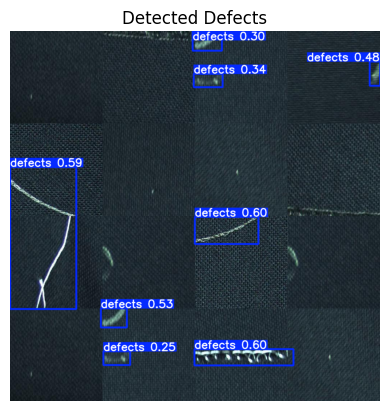

Detected defects:
defects detected with 0.60 confidence at [510, 880, 784, 925]
defects detected with 0.60 confidence at [511, 514, 687, 589]
defects detected with 0.59 confidence at [0, 376, 183, 769]
defects detected with 0.53 confidence at [251, 767, 323, 820]
defects detected with 0.48 confidence at [995, 84, 1024, 151]
defects detected with 0.34 confidence at [508, 118, 588, 155]
defects detected with 0.30 confidence at [505, 0, 586, 54]
defects detected with 0.25 confidence at [258, 886, 332, 924]


In [ ]:
# Path to the image
image_path = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test/collage_25_1.jpg'  # Replace with your image path

# Preparing the model
results = model.predict(source=image_path, conf=0.2, save=True)  # I put 50% confience to be more confdent in the detection

# Display the detections on the original image
image_with_detections = results[0].plot()
plt.imshow(cv2.cvtColor(image_with_detections, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Detected Defects")
plt.show()

# Process detections and print details
print("Detected defects:")
for box, conf, cls in zip(results[0].boxes.xyxy, results[0].boxes.conf, results[0].boxes.cls):
    x1, y1, x2, y2 = map(int, box)  # Bounding box coordinates
    label = model.names[int(cls)]  # Class label
    confidence = float(conf)       # Confidence score
    print(f"{label} detected with {confidence:.2f} confidence at [{x1}, {y1}, {x2}, {y2}]")


cv2.destroyAllWindows()


# Fabric simulation

Simulation of a big piece of fabric by combining the images from the database

In [ ]:
grid_size = (4, 4)
final_size = (1024, 1024)
final_image = (final_size[0] // grid_size[0], final_size[1] // grid_size[1])

def random_augmentation(image): #I wanted to have even more diversity, eve though some results might be the same, some might be different
    transformations = [
        Image.FLIP_LEFT_RIGHT,
        Image.FLIP_TOP_BOTTOM,
        Image.ROTATE_90,
        Image.ROTATE_180,
        Image.ROTATE_270,
        Image.TRANSPOSE,
        Image.TRANSVERSE
    ]
    transformation = random.choice(transformations)
    return image.transpose(transformation)


def make_collage(good_images, defect_images, collage_path, no_defects=False): # the collages are a mix of images without defects and images with
    number_of_images = grid_size[0] * grid_size[1]
    number_of_defect_images = 0 if no_defects else random.randint(1, number_of_images)

    selected_images = []
    for i in range(number_of_images - number_of_defect_images):
        selected_image = Image.open(random.choice(good_images))
        if random.randint(0, 100) <= 25:
            selected_image = random_augmentation(selected_image)
        selected_image = selected_image.resize(final_image)
        selected_images += [selected_image]

    for i in range(number_of_defect_images):
        selected_image = Image.open(random.choice(defect_images))
        if random.randint(0, 100) <= 25:
            selected_image = random_augmentation(selected_image)
        selected_image = selected_image.resize(final_image)
        selected_images += [selected_image]

    random.shuffle(selected_images)
    grid_image = Image.new("RGB", final_size) # the images are processed as .png initially because PIL library is not working with .jpg

    for row in range(grid_size[0]):
        for col in range(grid_size[1]):
            grid_image.paste(selected_images[row * grid_size[0] + col], (col * final_image[0], row * final_image[1]))

    # Check the size of the final collage
    print(f"Final collage size: {grid_image.size}")

    grid_image.save(collage_path)


def collage_creation():
    images_path = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/images'
    x = 0
    for type_cam in os.listdir(images_path):
        x = x + 1;
        if re.match(r'type\d+cam\d+', type_cam):
            type_cam_path = os.path.join(images_path, type_cam)
            collages_good_path = os.path.join(type_cam_path, 'collages', 'good')
            collages_defect_path = os.path.join(type_cam_path, 'collages', 'defect')
            os.makedirs(collages_good_path, exist_ok=True)
            os.makedirs(collages_defect_path, exist_ok=True)

            loaded_good = []
            loaded_defect = []

            anomaly_1 = os.path.join(type_cam_path, 'test', 'anomaly')
            if os.path.exists(anomaly_1) and os.path.isdir(anomaly_1):
                for item in os.listdir(anomaly_1):
                    loaded_defect += [os.path.join(anomaly_1, item)]

            good_1 = os.path.join(type_cam_path, 'test', 'good')
            if os.path.exists(good_1) and os.path.isdir(good_1):
                for item in os.listdir(good_1):
                    loaded_good += [os.path.join(good_1, item)]

            for i in range(100):
                print(f'Making collage for {type_cam} {i}/100')
                make_collage(loaded_good, loaded_defect, os.path.join(collages_defect_path, f'collage_{i}_{x}.png'), no_defects=False)
                make_collage(loaded_good, loaded_defect, os.path.join(collages_good_path, f'collage_{i}_{x}.png'), no_defects=True)


collage_creation()


Making collage for type2cam2 0/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 1/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 2/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 3/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 4/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 5/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 6/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 7/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 8/100
Final collage size: (1024, 1024)
Final collage size: (1024, 1024)
Making collage for type2cam2 9/100
Final collage size: (1024, 1024)
Final collage size: (10

Movement of the new images to the test folder

In [ ]:
collages_folder_path = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/images"
new_folder_path = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test"

def dataset_organisation_collages(input_path, image_path):
    for root, dirs, files in os.walk(input_path):
        if re.search(r"type\d+cam\d+/collages/", root):
            print(f"Processing folder: {root}")

            # Transfer files into respective folders
            for file in files:
                source = os.path.join(root, file)
                if file.endswith(".png"):  # Image files
                    destination = os.path.join(image_path, file)
                    shutil.move(source, destination)
                    print(f"Moved image: {source} -> {destination}")


# Run the function
dataset_organisation_collages(collages_folder_path, new_folder_path)


Processing folder: /content/gdrive/MyDrive/Colab Notebooks/newdataset/images/type2cam2/collages/good
Moved image: /content/gdrive/MyDrive/Colab Notebooks/newdataset/images/type2cam2/collages/good/collage_0_1.png -> /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test/collage_0_1.png
Moved image: /content/gdrive/MyDrive/Colab Notebooks/newdataset/images/type2cam2/collages/good/collage_1_1.png -> /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test/collage_1_1.png
Moved image: /content/gdrive/MyDrive/Colab Notebooks/newdataset/images/type2cam2/collages/good/collage_2_1.png -> /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test/collage_2_1.png
Moved image: /content/gdrive/MyDrive/Colab Notebooks/newdataset/images/type2cam2/collages/good/collage_3_1.png -> /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test/collage_3_1.png
Moved image: /content/gdrive/MyDrive/Colab Notebooks/newdataset/images/type2cam2/collages/good/collage_4_1.

Conversion of the images in .jpg from .png

In [ ]:
def convert_images_to_jpg(png_folder):

    # Iterate through all files in the folder
    for file_name in os.listdir(png_folder):
        file_path = os.path.join(png_folder, file_name)

        if os.path.isfile(file_path) and file_name.lower().endswith(".png"):
            try:
                # Open the image
                with Image.open(file_path) as img:

                    # Create a new file name with a .jpg extension
                    new_file_name = os.path.splitext(file_name)[0] + ".jpg"
                    new_file_path = os.path.join(png_folder, new_file_name)

                    # Save the image as JPEG
                    img.save(new_file_path, "JPEG")
                    print(f"Converted: {file_name} -> {new_file_name}")

                    # Remove the original file
                    os.remove(file_path)
                    print(f"Deleted original: {file_name}")

            except Exception as e:
                print(f"Failed to convert {file_name}: {e}")

png_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test"
convert_images_to_jpg(png_folder)


Converted: collage_0_1.png -> collage_0_1.jpg
Deleted original: collage_0_1.png
Converted: collage_1_1.png -> collage_1_1.jpg
Deleted original: collage_1_1.png
Converted: collage_2_1.png -> collage_2_1.jpg
Deleted original: collage_2_1.png
Converted: collage_3_1.png -> collage_3_1.jpg
Deleted original: collage_3_1.png
Converted: collage_4_1.png -> collage_4_1.jpg
Deleted original: collage_4_1.png
Converted: collage_5_1.png -> collage_5_1.jpg
Deleted original: collage_5_1.png
Converted: collage_6_1.png -> collage_6_1.jpg
Deleted original: collage_6_1.png
Converted: collage_7_1.png -> collage_7_1.jpg
Deleted original: collage_7_1.png
Converted: collage_8_1.png -> collage_8_1.jpg
Deleted original: collage_8_1.png
Converted: collage_9_1.png -> collage_9_1.jpg
Deleted original: collage_9_1.png
Converted: collage_10_1.png -> collage_10_1.jpg
Deleted original: collage_10_1.png
Converted: collage_11_1.png -> collage_11_1.jpg
Deleted original: collage_11_1.png
Converted: collage_12_1.png -> col

# Defect detection on the new test file

Analysing the new big image in smaller portions to facilitate the more accurate depiction and creating a matrix with the location of the defects

In [ ]:
def load_model(model_path):

    model = YOLO(model_path)
    return model

def detect_defects_and_good(image, model, window_size=256, step=128, conf=0.25):

    h, w, _ = image.shape
    result_image = image.copy()  # Copy of the image for visualization
    result_matrix = np.ones((h, w), dtype=np.uint8)  # Initialize matrix with all good regions as 1
    detections = []  # To store detection details

    # Sliding window loop
    for y in range(0, h - window_size + 1, step):
        for x in range(0, w - window_size + 1, step):
            # Extracting the window
            window = image[y:y+window_size, x:x+window_size]
            window_pil = Image.fromarray(window)

            # Use YOLO to predict the defects
            results = model.predict(source=window_pil, conf=conf, save=False, verbose=False)

            # Process the defecs
            for box, confidence, cls in zip(results[0].boxes.xyxy, results[0].boxes.conf, results[0].boxes.cls):
                x1, y1, x2, y2 = map(int, box)
                x1_global, y1_global = x1 + x, y1 + y
                x2_global, y2_global = x2 + x, y2 + y
                cls = int(cls)  # Convert classes to integer to be added to the analog matrix

                # Add detection details
                detections.append((x1_global, y1_global, x2_global, y2_global, cls, float(confidence)))

                # Update the result matrix and draw bounding boxes
                if cls == 0:  # Defects
                    result_matrix[y1_global:y2_global, x1_global:x2_global] = 0
                    cv2.rectangle(result_image, (x1_global, y1_global), (x2_global, y2_global), (0, 0, 255), 2)  # Red border

                elif cls == 1:  # regions without defects
                    cv2.rectangle(result_image, (x1_global, y1_global), (x2_global, y2_global), (0, 255, 0), 2)  # Green border
                    cv2.putText(
                        result_image, f"Good {confidence:.2f}",
                        (x1_global, y1_global - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1
                    )

    return result_image, result_matrix, detections

def process_defects_of_the_image(image_path, model, after_processing_folder, window_size=256, step=256, conf=0.25):

    # Load the image
    print(f"Loading image from: {image_path}")
    image = cv2.imread(image_path)

    if image is None:
        print(f"Error: Unable to read the image at {image_path}. Skipping.")
        return

    # Detect defects
    result_image, result_matrix, detections = detect_defects_and_good(image, model, window_size, step, conf)

    # Save the visualized image
    os.makedirs(after_processing_folder, exist_ok=True)
    output_image_path = os.path.join(after_processing_folder, os.path.basename(image_path))
    cv2.imwrite(output_image_path, result_image)
    print(f"Saved visualized image to: {output_image_path}")

    # Save the result matrix
    matrix_output_path = os.path.join(after_processing_folder, f"{os.path.splitext(os.path.basename(image_path))[0]}_matrix.npy")
    np.save(matrix_output_path, result_matrix)
    print(f"Saved result matrix to: {matrix_output_path}")

    # Print detection details
    print("Detected regions:")
    for (x1, y1, x2, y2, cls, confidence) in detections:
        label = "Defect" if cls == 0 else "Good"
        print(f"{label} detected with {confidence:.2f} confidence at [{x1}, {y1}, {x2}, {y2}]")

def process_defects_and_good_folder(folder_path, model, after_processing_folder, window_size=256, step=256, conf=0.25):

    os.makedirs(after_processing_folder, exist_ok=True)

    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        if not filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            print(f"Skipping unsupported file: {filename}")
            continue

        process_defects_of_the_image(image_path, model, after_processing_folder, window_size, step, conf)


model_path = '/content/runs/detect/train/weights/best.pt'
model = load_model(model_path)
before_processing_folder = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test'
after_processing_folder = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test ou'

process_defects_and_good_folder(
        folder_path=before_processing_folder,
        model=model,
        after_processing_folder=after_processing_folder,
        window_size=256,
        step=128,
        conf=0.5
    )


Datele de ieșire de afișat au fost trunchiate la ultimele 5000 linii.
Good detected with 0.84 confidence at [768, 640, 1023, 895]
Good detected with 0.87 confidence at [0, 768, 256, 1023]
Good detected with 0.89 confidence at [128, 768, 253, 1023]
Good detected with 0.54 confidence at [252, 768, 384, 1023]
Defect detected with 0.82 confidence at [512, 952, 767, 1024]
Defect detected with 0.80 confidence at [640, 950, 775, 1024]
Good detected with 0.94 confidence at [768, 768, 1024, 1024]
Loading image from: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test/collage_17_9.jpg
Saved visualized image to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test ou/collage_17_9.jpg
Saved result matrix to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test ou/collage_17_9_matrix.npy
Detected regions:
Defect detected with 0.56 confidence at [0, 138, 16, 167]
Defect detected with 0.84 confidence at [257, 1, 384, 83]
Defect detected with 0.79 confiden

Matrix and image visualization

Loaded matrix of shape: (1024, 1024)
Loaded image of shape: (1024, 1024, 3)


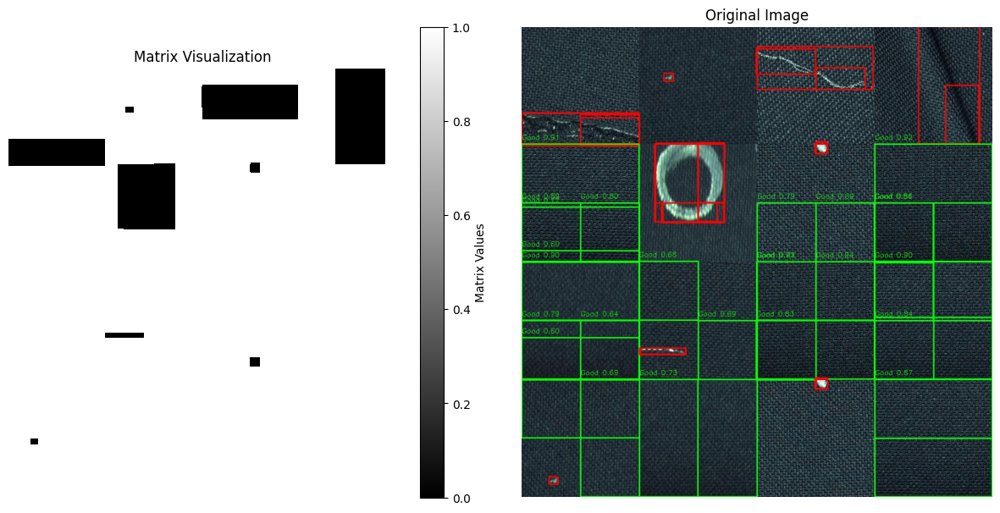

In [ ]:
def visualize_matrix_and_image(matrix_path, image_path):

    # Load the matrix
    matrix = np.load(matrix_path)
    print(f"Loaded matrix of shape: {matrix.shape}")

    # Load the original image
    original_image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if original_image is None:
        print(f"Error: Unable to load image from {image_path}")
        return

    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    print(f"Loaded image of shape: {original_image.shape}")

    # Create a figure to display both
    plt.figure(figsize=(12, 6))

    # Display the matrix
    plt.subplot(1, 2, 1)
    plt.imshow(matrix, cmap='gray', interpolation='nearest')
    plt.colorbar(label="Matrix Values")
    plt.title("Matrix Visualization")
    plt.axis('off')

    # Display the original image
    plt.subplot(1, 2, 2)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

matrix_path = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test ou/collage_9_8_matrix.npy'
image_path = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test ou/collage_9_8.jpg'
visualize_matrix_and_image(matrix_path, image_path)



Defect classification based on size

Detecting pinholes

In [ ]:
def process_defect_matrix(matrix, max_area=300):

    updated_matrix = matrix.copy()
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats((matrix == 0).astype(np.uint8))

    pinholes = []  # To store detected pinhole bounding boxes

    for i in range(1, num_labels):  # Start from 1 to skip the background
        x, y, w, h, area = stats[i]
        if area <= max_area:
            # Mark pinholes in the updated matrix
            updated_matrix[labels == i] = 2
            pinholes.append((x, y, x + w, y + h, area))

    return updated_matrix, pinholes

def visualize_pinholes(collage, pinholes):

    # Create a clean copy of the collage
    updated_collage = collage.copy()

    for (x1, y1, x2, y2, area) in pinholes:
        # Draw pink border for pinholes
        cv2.rectangle(updated_collage, (x1, y1), (x2, y2), (255, 0, 255), 2)  # Pink border
        # Add "pinhole" label
        cv2.putText(
            updated_collage, f"pinhole (Area: {area})",
            (x1, y1 - 10),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 255), 1  # Pink text
        )

    return updated_collage


def process_folder_for_pinholes(matrix_folder, collage_folder, pinhole_images_folder, max_area=300):

    os.makedirs(pinhole_images_folder, exist_ok=True)

    for matrix_file in os.listdir(matrix_folder):
        if not matrix_file.endswith('.npy'):
            continue

        # Load the matrix
        matrix_path = os.path.join(matrix_folder, matrix_file)
        matrix = np.load(matrix_path)

        # Process the matrix to detect pinholes
        updated_matrix, pinholes = process_defect_matrix(matrix, max_area)

        # Save the updated matrix
        updated_matrix_path = os.path.join(pinhole_images_folder, matrix_file)
        np.save(updated_matrix_path, updated_matrix)
        print(f"Saved updated matrix to: {updated_matrix_path}")

        # Find the corresponding collage
        collage_name = matrix_file.replace("_matrix.npy", ".jpg")
        collage_path = os.path.join(collage_folder, collage_name)

        if not os.path.exists(collage_path):
            print(f"No corresponding collage found for matrix: {matrix_file}")
            continue

        # Load the collage
        collage = cv2.imread(collage_path)

        if collage is None:
            print(f"Error loading collage: {collage_path}")
            continue

        # Visualize pinholes on the collage
        updated_collage = visualize_pinholes(collage, pinholes)

        # Save the updated collage
        updated_collage_path = os.path.join(pinhole_images_folder, collage_name)
        cv2.imwrite(updated_collage_path, updated_collage)
        print(f"Saved updated collage to: {updated_collage_path}")


matrix_folder = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test ou'
collage_folder = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test ou'
pinhole_images_folder = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output'

# Process matrices and visualize pinholes
process_folder_for_pinholes(
        matrix_folder=matrix_folder,
        collage_folder=collage_folder,
        pinhole_images_folder=pinhole_images_folder,
        max_area=300  # Maximum area for pinhole classification
 )


Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_99_4_matrix.npy
Saved updated collage to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_99_4.jpg
Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_1_5_matrix.npy
Saved updated collage to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_1_5.jpg
Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_2_5_matrix.npy
Saved updated collage to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_2_5.jpg
Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_3_5_matrix.npy
Saved updated collage to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_3_5.jpg
Saved updated matrix to: /content/gdri

Loaded matrix of shape: (1024, 1024)
Loaded image of shape: (1024, 1024, 3)


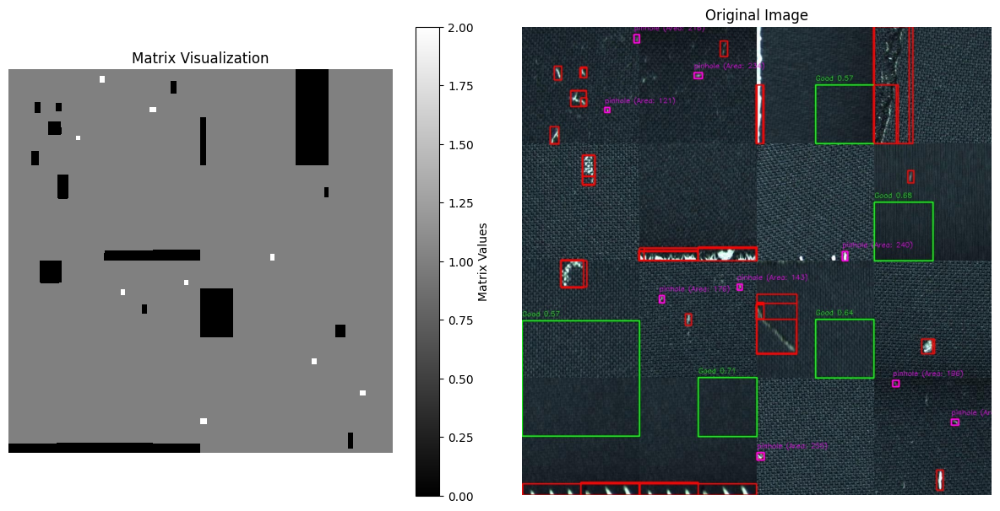

In [ ]:
def visualize_matrix_and_image(matrix_path, image_path):

    # Load the matrix
    matrix = np.load(matrix_path)
    print(f"Loaded matrix of shape: {matrix.shape}")

    # Load the original image
    original_image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if original_image is None:
        print(f"Error: Unable to load image from {image_path}")
        return
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    print(f"Loaded image of shape: {original_image.shape}")

    # Create a figure to display both
    plt.figure(figsize=(12, 6))

    # Display the matrix
    plt.subplot(1, 2, 1)
    plt.imshow(matrix, cmap='gray', interpolation='nearest')
    plt.colorbar(label="Matrix Values")
    plt.title("Matrix Visualization")
    plt.axis('off')

    # Display the original image
    plt.subplot(1, 2, 2)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

matrix_path = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_5_8_matrix.npy'
image_path = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output/collage_5_8.jpg'
visualize_matrix_and_image(matrix_path, image_path)




# Big defects classification and labeling



In [ ]:
def crop_large_defects(matrix, image, collage_name, min_area=300, big_defects_folder="crops"):

    os.makedirs(big_defects_folder, exist_ok=True)
    result_image = image.copy()
    updated_matrix = matrix.copy()

    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats((matrix == 0).astype(np.uint8))
    defect_id = 3  # Start defect IDs from 3 to ensure that the defect, good and pinholes value are not confused by the model

    for i in range(1, num_labels):  #
        x, y, w, h, area = stats[i]
        if area > min_area:
            # Crop the defect region
            defect_crop = image[y:y + h, x:x + w]

            # Save the cropped defect with collage name to avoid overwriting and to be able to identify them later
            crop_path = os.path.join(big_defects_folder, f"{collage_name}_defect_{defect_id}.jpg")
            cv2.imwrite(crop_path, defect_crop)
            print(f"Saved cropped defect to: {crop_path}")

            # Update the matrix with the new defect ID
            updated_matrix[y:y + h, x:x + w] = defect_id

            # Annotate the image with the defect ID
            cv2.rectangle(result_image, (x, y), (x + w, y + h), (255, 0, 0), 2)  # Blue box
            cv2.putText(
                result_image, f"ID: {defect_id}",
                (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1
            )
            defect_id += 1

    return updated_matrix, result_image


def cropping_the_collages(matrix_folder, collage_folder, big_defects_folder, min_area=300):

    os.makedirs(big_defects_folder, exist_ok=True)

    for file_name in os.listdir(matrix_folder):
        if not file_name.endswith('_matrix.npy'):
            continue

        # Construct paths for the matrix and corresponding collage
        matrix_path = os.path.join(matrix_folder, file_name)
        collage_name = file_name.replace("_matrix.npy", ".jpg")
        collage_path = os.path.join(collage_folder, collage_name)

        if not os.path.exists(collage_path):
            print(f"Collage not found for {file_name}, skipping.")
            continue

        # Load the matrix and collage
        matrix = np.load(matrix_path)
        collage = cv2.imread(collage_path)

        # Process the matrix and collage with the collage name
        updated_matrix, annotated_image = crop_large_defects(
            matrix=matrix,
            image=collage,
            collage_name=os.path.splitext(collage_name)[0],  # Get the name of the collage without extension
            min_area=min_area,
            big_defects_folder=os.path.join(big_defects_folder, "crops")
        )

        # Save the updated matrix with collage name
        updated_matrix_path = os.path.join(big_defects_folder, f"{os.path.splitext(collage_name)[0]}_updated_matrix.npy")
        np.save(updated_matrix_path, updated_matrix)
        print(f"Saved updated matrix to: {updated_matrix_path}")

        # Save the annotated collage with collage name
        annotated_image_path = os.path.join(big_defects_folder, f"{os.path.splitext(collage_name)[0]}.jpg")
        cv2.imwrite(annotated_image_path, annotated_image)
        print(f"Saved annotated collage to: {annotated_image_path}")



matrix_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output"
collage_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test"
big_defects_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects"

cropping_the_collages(
    matrix_folder=matrix_folder,
    collage_folder=collage_folder,
    big_defects_folder=big_defects_folder,
    min_area=300
)


Datele de ieșire de afișat au fost trunchiate la ultimele 5000 linii.
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops/collage_26_4_defect_13.jpg
Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/collage_26_4_updated_matrix.npy
Saved annotated collage to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/collage_26_4.jpg
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops/collage_27_4_defect_3.jpg
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops/collage_27_4_defect_4.jpg
Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/collage_27_4_updated_matrix.npy
Saved annotated collage to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/collage_27_4.jpg
Saved cropped defect to: /con

In [ ]:
def calculate_padding_color(image):

    # Extract border pixels to define the background colour
    top_border = image[0, :]  # Top row
    bottom_border = image[-1, :]  # Bottom row
    left_border = image[:, 0]  # Left column
    right_border = image[:, -1]  # Right column

    # Concatenate all border pixels
    border_pixels = np.concatenate((top_border, bottom_border, left_border, right_border), axis=0)

    # Calculate the mean color
    if len(image.shape) == 3:  # Color image, because of the RGB featurewhich represents 3 matrixes of colour
        pad_color = tuple(map(int, np.mean(border_pixels, axis=0)))
    else:  # Grayscale image
        pad_color = int(np.mean(border_pixels))

    return pad_color

def pad_to_size(image, target_size, pad_color):

    height, width = image.shape[:2]
    target_height, target_width = target_size

    pad_top = max((target_height - height) // 2, 0)
    pad_bottom = max(target_height - height - pad_top, 0)
    pad_left = max((target_width - width) // 2, 0)
    pad_right = max(target_width - width - pad_left, 0)

    print(f"Padding color: {pad_color}")

    padded_image = cv2.copyMakeBorder(
        image,
        pad_top, pad_bottom, pad_left, pad_right,
        cv2.BORDER_CONSTANT,
        value=pad_color
    )
    return padded_image

def padding_the_defects(unpadded_folder, padded_folder, target_size):

    if not os.path.exists(padded_folder):
        os.makedirs(padded_folder)

    for filename in os.listdir(unpadded_folder):
        input_path = os.path.join(unpadded_folder, filename)

        # Read the image
        image = cv2.imread(input_path)

        if image is None:
            print(f"Failed to load image: {filename}")
            continue

        # Calculate dynamic padding color
        pad_color = calculate_padding_color(image)

        # Pad the image
        padded_image = pad_to_size(image, target_size, pad_color)

        # Save the padded image
        padded_path = os.path.join(padded_folder, filename)
        cv2.imwrite(padded_path, padded_image)
        print(f"Processed and saved: {padded_path}")

unpadded_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops"
padded_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops padded"
target_size = (224, 224)

padding_the_defects(unpadded_folder, padded_folder, target_size)


Streaming output truncated to the last 5000 lines.
Padding color: (61, 56, 40)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops padded/collage_50_7_defect_6.jpg
Padding color: (56, 49, 35)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops padded/collage_50_7_defect_8.jpg
Padding color: (52, 46, 33)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops padded/collage_50_7_defect_9.jpg
Padding color: (55, 51, 37)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops padded/collage_50_7_defect_7.jpg
Padding color: (71, 64, 54)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops padded/collage_50_7_defect_10.jpg
Padding color: (48, 41, 28)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops pad

VGG19

In [ ]:
# Function to process labels and bounding box data
def process_labels_and_boxes_VGG19(csv_file_path, target_defects):
    data = pd.read_csv(csv_file_path)

    # Filter the dataset to keep only target defect types
    data = data[data['class'].isin(target_defects)]

    # Extract bounding boxes and class labels
    data['defect_types'] = data['class'].apply(lambda x: [x])
    mlb = MultiLabelBinarizer(classes=target_defects)
    multi_labels = mlb.fit_transform(data['defect_types'])
    data['multi_hot_labels'] = multi_labels.tolist()

    return data, mlb

# Custom data generator for multi-label classification
class MultiLabelDataGenerator(Sequence):
    def __init__(self, image_paths, labels, batch_size, target_size):
        self.image_paths = image_paths
        self.labels = labels
        self.batch_size = batch_size
        self.target_size = target_size

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        batch_paths = self.image_paths[index * self.batch_size:(index + 1) * self.batch_size]
        batch_labels = self.labels[index * self.batch_size:(index + 1) * self.batch_size]

        images = []
        for img_path in batch_paths:
            img = load_img(img_path, target_size=self.target_size)
            img = img_to_array(img) / 255.0
            images.append(img)

        return np.array(images), np.array(batch_labels)

# Load and process data
target_defects = ['hole', 'loose thread', 'pinhole', 'scratch','small hole',  'spot', 'stitch defect' ]
data_train, mlb = process_labels_and_boxes_VGG19('/content/gdrive/MyDrive/Colab Notebooks/newdataset/vgg/train.csv', target_defects)
data_val, _ = process_labels_and_boxes_VGG19('/content/gdrive/MyDrive/Colab Notebooks/newdataset/vgg/val.csv', target_defects)

image_dir_train = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/vgg/images/train'
image_dir_val = '/content/gdrive/MyDrive/Colab Notebooks/newdataset/vgg/images/val'

# Create a list of image paths and corresponding multi-hot labels
image_paths_train = data_train['filename'].apply(lambda x: os.path.join(image_dir_train, x)).tolist()
multi_labels_train = np.array(data_train['multi_hot_labels'].tolist())
image_paths_val = data_val['filename'].apply(lambda x: os.path.join(image_dir_val, x)).tolist()
multi_labels_val = np.array(data_val['multi_hot_labels'].tolist())

train_generator = MultiLabelDataGenerator(image_paths_train, multi_labels_train, batch_size=32, target_size=(224, 224))
val_generator = MultiLabelDataGenerator(image_paths_val, multi_labels_val, batch_size=32, target_size=(224, 224))


Epoch 1/40
46/46 [==============================] - ETA: 0s - loss: 30.8045 - accuracy: 0.1535 - precision: 0.1265 - recall: 0.0888 - f1_score: 0.1043 

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:2699: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


46/46 [==============================] - 1470s 32s/step - loss: 30.8045 - accuracy: 0.1535 - precision: 0.1265 - recall: 0.0888 - f1_score: 0.1043 - val_loss: 30.4741 - val_accuracy: 0.1667 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0000e+00
Epoch 2/40
46/46 [==============================] - 686s 15s/step - loss: 30.2774 - accuracy: 0.1851 - precision: 0.1858 - recall: 0.0234 - f1_score: 0.0416 - val_loss: 29.9883 - val_accuracy: 0.3616 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0000e+00
Epoch 3/40
46/46 [==============================] - 675s 15s/step - loss: 29.7886 - accuracy: 0.2271 - precision: 0.3333 - recall: 0.0289 - f1_score: 0.0532 - val_loss: 29.5142 - val_accuracy: 0.2825 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_f1_score: 0.0000e+00
Epoch 4/40
46/46 [==============================] - 663s 14s/step - loss: 29.3188 - accuracy: 0.2615 - precision: 0.3128 - recall: 0.0385 - f1_score: 0.0686 - val_loss: 2

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


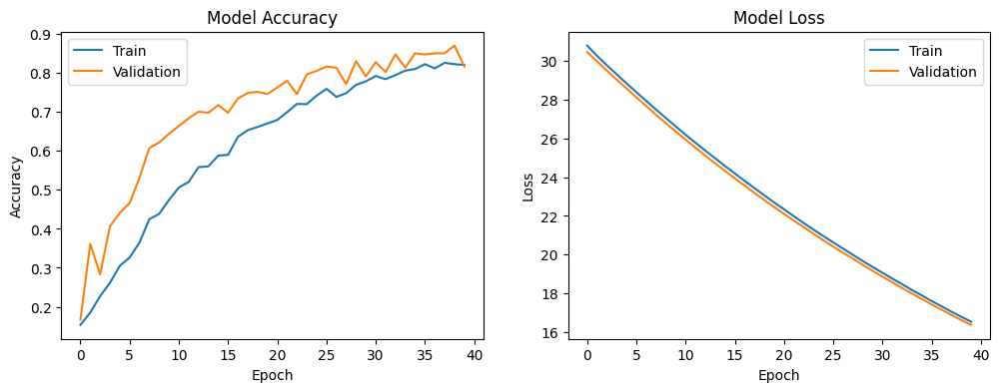

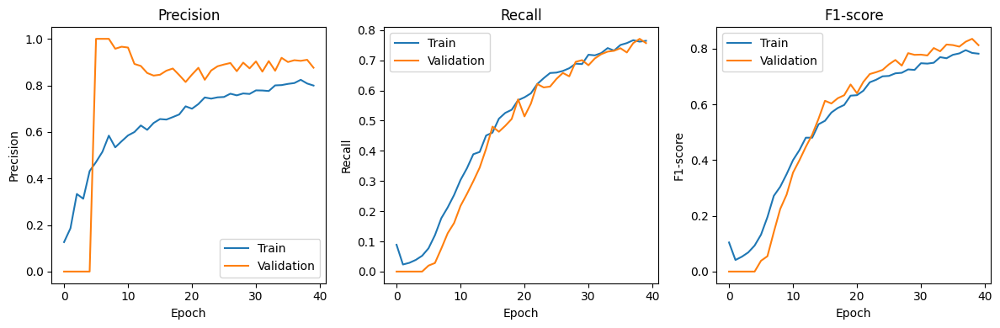

In [ ]:
class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name='f1_score', dtype=None):
        tf.keras.metrics.Metric.__init__(self, name=name, dtype=dtype)
        self.precision_metric = Precision()
        self.recall_metric = Recall()

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Update the Precision and Recall metrics
        self.precision_metric.update_state(y_true, y_pred)
        self.recall_metric.update_state(y_true, y_pred)

    def result(self):
        # Calculate Precision and Recall
        precision = self.precision_metric.result()
        recall = self.recall_metric.result()
        # Calculate F1 Score
        return 2 * (precision * recall) / (precision + recall + K.epsilon())

    def reset_states(self):
        # Reset the Precision and Recall metrics
        self.precision_metric.reset_states()
        self.recall_metric.reset_states()

def create_finetuned_cnn_model(input_shape, num_classes):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    for layer in base_model.layers:
        layer.trainable = True  # Unfreeze all layers for fine-tuning

    model = models.Sequential()
    model.add(base_model)
    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation='relu' , kernel_regularizer=regularizers.l2(0.06)))
    model.add(layers.Dropout(0.7))
    model.add(layers.Dense(num_classes, activation='sigmoid'))

    return model

input_shape = (224, 224, 3)
num_classes = len(target_defects)
model = create_finetuned_cnn_model(input_shape, num_classes)

# Compile the model with a lower learning rate for fine-tuning
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.93),
              loss='binary_crossentropy',
              metrics=['accuracy', Precision(name='precision'), Recall(name='recall'), F1Score()])

# Train the model with class weights
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=40,
)

# Evaluate on the validation set
val_loss, val_accuracy, val_precision, val_recall, val_f1 = model.evaluate(val_generator)
print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy}')
print(f'Validation Precision: {val_precision}')
print(f'Validation Recall: {val_recall}')
print(f'Validation F1-score: {val_f1}')

# Model summary
model.summary()
model.save('defect_detection_VGG19.h5')

# Plot training, validation accuracy/loss/recall/precision/f1-score
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.plot(history.history['precision'])
plt.plot(history.history['val_precision'])
plt.title('Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend(['Train', 'Validation'])

plt.subplot(1, 3, 2)
plt.plot(history.history['recall'])
plt.plot(history.history['val_recall'])
plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend(['Train', 'Validation'])

plt.subplot(1, 3, 3)
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('F1-score')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.legend(['Train', 'Validation'])

plt.tight_layout()
plt.show()


In [ ]:
!cp defect_detection_VGG19.h5 "/content/gdrive/MyDrive/Colab Notebooks/newdataset/YOLOv8"

In [ ]:
import tensorflow as tf

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("GPU memory growth enabled")
    except RuntimeError as e:
        print(e)



Physical devices cannot be modified after being initialized


Changing the temporary ID of the defects from the original matrix into the defect idenified

In [ ]:
def defect_ID_identification(crop_name):
    if "_defect_" not in crop_name:
        raise ValueError(f"Invalid crop name format: {crop_name}")
    defect_id = crop_name.split("_defect_")[-1].split(".")[0]  # Extract the defect ID
    return int(defect_id)

# Function to extract the collage name
def defect_collage_identification(crop_name):

    return "_".join(crop_name.split("_")[:3])  # Extract the first three parts for the collage name

# Function to get defect size and position from the matrix
def get_defect_info(matrix, defect_id):
    # Find connected components with the same defect ID
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats((matrix == defect_id).astype(np.uint8))

    for i in range(1, num_labels):
        x, y, w, h, area = stats[i]
        return x, y, w, h  # Return the bounding box

    return None  # If the defect ID is not found

# Function to classify a defect using the VGG model
def classify_defect(cropped_image, model, target_size=(224, 224)):
    resized_crop = cv2.resize(cropped_image, target_size)
    img_array = img_to_array(resized_crop) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    prediction = model.predict(img_array)[0]
    class_id = np.argmax(prediction)
    confidence = prediction[class_id]
    return class_id, confidence

# Function to update the target matrix with the defect type
def update_target_matrix_with_defect(target_matrix, x, y, w, h, defect_class):
    # Update the target matrix with the defect class in the corresponding position
    target_matrix[y:y + h, x:x + w] = defect_class

# Process cropped images and update the target matrix
def process_cropped_images(crops_folder, original_matrices_folder, target_matrices_folder, output_folder, model_path, class_names):
    os.makedirs(output_folder, exist_ok=True)

    # Load the VGG model
    model = load_model(model_path)

    processed_collages = {}

    for crop_name in os.listdir(crops_folder):
        if not crop_name.endswith(('.jpg', '.png')):
            continue

        try:
            defect_id = defect_ID_identification(crop_name)
        except ValueError as e:
            print(e)
            continue

        collage_name = defect_collage_identification(crop_name)

        # If this collage hasn't been processed yet, load its matrices
        if collage_name not in processed_collages:
            # Load the corresponding original matrix
            original_matrix_path = os.path.join(original_matrices_folder, f"{collage_name}_updated_matrix.npy")
            if not os.path.exists(original_matrix_path):
                print(f"Original matrix for {collage_name} not found, skipping.")
                continue

            original_matrix = np.load(original_matrix_path)

            # Load the target matrix
            target_matrix_path = os.path.join(target_matrices_folder, f"{collage_name}_matrix.npy")
            if not os.path.exists(target_matrix_path):
                print(f"Target matrix for {collage_name} not found, skipping.")
                continue

            target_matrix = np.load(target_matrix_path)
            processed_collages[collage_name] = (original_matrix, target_matrix)

        original_matrix, target_matrix = processed_collages[collage_name]

        # Get defect size and position
        defect_info = get_defect_info(original_matrix, defect_id)
        if not defect_info:
            print(f"Defect ID {defect_id} not found in {collage_name}, skipping.")
            continue

        x, y, w, h = defect_info

        # Load the cropped image
        crop_path = os.path.join(crops_folder, crop_name)
        cropped_image = cv2.imread(crop_path)

        if cropped_image is None:
            print(f"Failed to load cropped image: {crop_name}, skipping.")
            continue

        # Classify the defect
        defect_class_id, confidence = classify_defect(cropped_image, model)
        defect_class_name = class_names[defect_class_id]
        print(f"Classified defect: {defect_class_name} with confidence {confidence:.2f}")

        # Update the target matrix with the defect class
        update_target_matrix_with_defect(target_matrix, x, y, w, h, defect_class_id + 10)  # To avoid conflict with the other values assigned to other classes we made them to start with 10

    # Save all updated target matrices
    for collage_name, (_, target_matrix) in processed_collages.items():
        output_path = os.path.join(output_folder, f"{collage_name}_updated_matrix.npy")
        np.save(output_path, target_matrix)
        print(f"Final updated matrix saved to: {output_path}")

crops_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects/crops padded"
original_matrices_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/Big-defects"
target_matrices_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output"
output_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test "
model_path = "/content/defect_detection_VGG19.h5"

# List of class names corresponding to the model's output
class_names = ["hole", "loose thread", "pinhole", "scratch", "small hole", "spot", "stitch defect"]

process_cropped_images(crops_folder, original_matrices_folder, target_matrices_folder, output_folder, model_path, class_names)


Datele de ieșire de afișat au fost trunchiate la ultimele 5000 linii.
Classified defect: spot with confidence 0.57
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Classified defect: spot with confidence 0.82
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Classified defect: spot with confidence 0.98
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Classified defect: loose thread with confidence 0.71
Defect ID 17 not found in collage_69_1, skipping.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Classified defect: loose thread with confidence 0.94
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Classified defect: loose thread with confidence 0.67
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Classified defect: stitch defect with confidence 0.98
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Classified defect: stitch defect with confidence 0.97
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Classified defect: loose thread with confidence 0.92
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Classified defect: loose thread with confidence 0.67
Defect ID 9 not found in colla

Adding the preidentified defects in the new matrix

In [ ]:
def merge_existing_pinholes_into_large_matrix(large_defect_matrix, pinhole_defect_stats, pinhole_id=2, max_area=300):

    updated_matrix = large_defect_matrix.copy()

    for x, y, w, h, area in pinhole_defect_stats:
        if area <= max_area:
            updated_matrix[y:y + h, x:x + w] = pinhole_id  # Mark the pinhole defect

    return updated_matrix

def extract_pinhole_defect_stats(pinhole_defect_matrix):

    _, _, stats, _ = cv2.connectedComponentsWithStats((pinhole_defect_matrix == 0).astype(np.uint8))
    return stats[1:]

def process_matrices_and_save(large_defect_folder, pinhole_defect_folder, max_area=300):

    for large_file in os.listdir(large_defect_folder):
        if large_file.endswith("_updated_matrix.npy"):
            large_defect_path = os.path.join(large_defect_folder, large_file)
            base_name = large_file.replace("_updated_matrix.npy", "")
            pinhole_file = f"{base_name}_matrix.npy"
            pinhole_defect_path = os.path.join(pinhole_defect_folder, pinhole_file)

            if not os.path.exists(pinhole_defect_path):
                print(f"Pinhole matrix not found for {large_file}, skipping.")
                continue

            # Load matrices
            large_defect_matrix = np.load(large_defect_path)
            pinhole_defect_matrix = np.load(pinhole_defect_path)

            # Merge pinhole defects into the large defect matrix
            updated_matrix = merge_existing_pinholes_into_large_matrix(
                large_defect_matrix,
                extract_pinhole_defect_stats(pinhole_defect_matrix),
                pinhole_id=2,
                max_area=max_area
            )

            # Save the updated matrix
            updated_matrix_path = os.path.join(large_defect_folder, f"{base_name}_final_matrix.npy")
            np.save(updated_matrix_path, updated_matrix)
            print(f"Updated matrix saved to: {updated_matrix_path}")

large_defect_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test"
pinhole_defect_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test_output"
max_area = 300

process_matrices_and_save(large_defect_folder, pinhole_defect_folder, max_area)


Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test/collage_69_4_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test/collage_70_4_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test/collage_54_6_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test/collage_71_4_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test/collage_72_4_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test/collage_74_4_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test/collage_73_4_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test/collage_76_4_f

Visualising the matrix

In [ ]:
def draw_bounding_boxes(image, matrix, class_names, class_colors, reserved_ids={0, 1}):

    annotated_image = image.copy()

    # Get unique defect IDs (excluding reserved IDs)
    defect_ids = np.unique(matrix)
    defect_ids = [d for d in defect_ids if d not in reserved_ids]

    for defect_id in defect_ids:
        # Find connected components for the current defect
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats((matrix == defect_id).astype(np.uint8))

        for i in range(1, num_labels):
            x, y, w, h, _ = stats[i]
            class_id = defect_id - 10  # Adjust ID to match class index
            class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown {class_id}"
            color = class_colors.get(class_id, (255, 255, 255))  # Default to white if color not defined

            # Draw bounding box and label
            cv2.rectangle(annotated_image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(annotated_image, class_name, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    return annotated_image

if __name__ == "__main__":
    image_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/test"
    matrix_folder = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/yolo/images/vgg_test_new"
    class_names = ["hole", "loose thread", "pinhole", "scratch", "small hole", "spot", "stitch defect"]

    # Assign colors to each class
    class_colors = {
        0: (255, 0, 0),       # Red for "hole"
        1: (0, 255, 0),       # Green for "loose thread"
        2: (255, 0, 255),     # Magenta for "pinhole"
        3: (0, 255, 255),     # Yellow for "scratch"
        4: (0, 0, 255),       # Blue for "small hole"
        5: (128, 0, 128),     # Purple for "spot"
        6: (255, 165, 0),     # Orange for "stitch defect"
    }

    # Exclude reserved IDs (e.g., 0: skipped defects, 1: good regions)
    reserved_ids = {0, 1}

    def show_image(image_name):
        # Derive paths for the image and matrix
        image_path = os.path.join(image_folder, image_name)
        matrix_name = image_name.replace(".jpg", "_updated_matrix.npy")
        matrix_path = os.path.join(matrix_folder, matrix_name)

        if not os.path.exists(image_path) or not os.path.exists(matrix_path):
            print(f"Missing image or matrix for: {image_name}")
            return

        # Load image and matrix
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for proper display
        matrix = np.load(matrix_path)

        # Annotate image
        annotated_image = draw_bounding_boxes(image, matrix, class_names, class_colors, reserved_ids)

        # Display the annotated image
        plt.figure(figsize=(10, 10))
        plt.imshow(annotated_image)
        plt.axis("off")
        plt.title(f"Annotated Image: {image_name}")
        plt.show()


    image_names = [f for f in os.listdir(image_folder) if f.endswith(".jpg")]
    interact(show_image, image_name=image_names)


interactive(children=(Dropdown(description='image_name', options=('collage_10.jpg', 'collage_11.jpg', 'collage…


# test

In [ ]:
def load_model(model_path):

    model = YOLO(model_path)
    return model

def detect_defects_and_good(image, model, window_size=256, step=128, conf=0.25):

    h, w, _ = image.shape
    result_image = image.copy()  # Copy of the image for visualization
    result_matrix = np.ones((h, w), dtype=np.uint8)  # Initialize matrix with all good regions as 1
    detections = []  # To store detection details

    # Sliding window loop
    for y in range(0, h - window_size + 1, step):
        for x in range(0, w - window_size + 1, step):
            # Extracting the window
            window = image[y:y+window_size, x:x+window_size]
            window_pil = Image.fromarray(window)

            # Use YOLO to predict the defects
            results = model.predict(source=window_pil, conf=conf, save=False, verbose=False)

            # Process the defecs
            for box, confidence, cls in zip(results[0].boxes.xyxy, results[0].boxes.conf, results[0].boxes.cls):
                x1, y1, x2, y2 = map(int, box)
                x1_global, y1_global = x1 + x, y1 + y
                x2_global, y2_global = x2 + x, y2 + y
                cls = int(cls)  # Convert classes to integer to be added to the analog matrix

                # Add detection details
                detections.append((x1_global, y1_global, x2_global, y2_global, cls, float(confidence)))

                # Update the result matrix and draw bounding boxes
                if cls == 0:  # Defects
                    result_matrix[y1_global:y2_global, x1_global:x2_global] = 0
                    cv2.rectangle(result_image, (x1_global, y1_global), (x2_global, y2_global), (0, 0, 255), 2)  # Red border

                elif cls == 1:  # regions without defects
                    cv2.rectangle(result_image, (x1_global, y1_global), (x2_global, y2_global), (0, 255, 0), 2)  # Green border
                    cv2.putText(
                        result_image, f"Good {confidence:.2f}",
                        (x1_global, y1_global - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1
                    )

    return result_image, result_matrix, detections

def process_defects_of_the_image(image_path, model, after_processing_folder, window_size=256, step=256, conf=0.25):

    # Load the image
    print(f"Loading image from: {image_path}")
    image = cv2.imread(image_path)

    if image is None:
        print(f"Error: Unable to read the image at {image_path}. Skipping.")
        return

    # Detect defects
    result_image, result_matrix, detections = detect_defects_and_good(image, model, window_size, step, conf)

    # Save the visualized image
    os.makedirs(after_processing_folder, exist_ok=True)
    output_image_path = os.path.join(after_processing_folder, os.path.basename(image_path))
    cv2.imwrite(output_image_path, result_image)
    print(f"Saved visualized image to: {output_image_path}")

    # Save the result matrix
    matrix_output_path = os.path.join(after_processing_folder, f"{os.path.splitext(os.path.basename(image_path))[0]}_matrix.npy")
    np.save(matrix_output_path, result_matrix)
    print(f"Saved result matrix to: {matrix_output_path}")

    # Print detection details
    print("Detected regions:")
    for (x1, y1, x2, y2, cls, confidence) in detections:
        label = "Defect" if cls == 0 else "Good"
        print(f"{label} detected with {confidence:.2f} confidence at [{x1}, {y1}, {x2}, {y2}]")

def process_defects_and_good_folder(folder_path, model, after_processing_folder, window_size=256, step=256, conf=0.25):

    os.makedirs(after_processing_folder, exist_ok=True)

    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        if not filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            print(f"Skipping unsupported file: {filename}")
            continue

        process_defects_of_the_image(image_path, model, after_processing_folder, window_size, step, conf)


model_path = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/YOLOv8/defect_detection_yolo.pt"
model = load_model(model_path)
before_processing_folder = '/content/gdrive/MyDrive/Colab Notebooks/test/test'
after_processing_folder = '/content/gdrive/MyDrive/Colab Notebooks/test/process folder/test ou'

process_defects_and_good_folder(
        folder_path=before_processing_folder,
        model=model,
        after_processing_folder=after_processing_folder,
        window_size=256,
        step=128,
        conf=0.5
    )


Loading image from: /content/gdrive/MyDrive/Colab Notebooks/test/test/collage_4_2.jpg
Saved visualized image to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test ou/collage_4_2.jpg
Saved result matrix to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test ou/collage_4_2_matrix.npy
Detected regions:
Defect detected with 0.61 confidence at [33, 106, 148, 130]
Good detected with 0.80 confidence at [256, 0, 383, 255]
Defect detected with 0.69 confidence at [128, 109, 147, 129]
Defect detected with 0.68 confidence at [462, 122, 474, 143]
Defect detected with 0.69 confidence at [462, 122, 474, 143]
Defect detected with 0.75 confidence at [670, 64, 687, 99]
Defect detected with 0.75 confidence at [670, 64, 687, 99]
Good detected with 0.62 confidence at [767, 0, 895, 255]
Good detected with 0.87 confidence at [768, 0, 1024, 256]
Defect detected with 0.64 confidence at [32, 363, 46, 383]
Good detected with 0.62 confidence at [0, 128, 255, 256]
Good detected with 0.

In [ ]:
def process_defect_matrix(matrix, max_area=300):

    updated_matrix = matrix.copy()
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats((matrix == 0).astype(np.uint8))

    pinholes = []  # To store detected pinhole bounding boxes

    for i in range(1, num_labels):  # Start from 1 to skip the background
        x, y, w, h, area = stats[i]
        if area <= max_area:
            # Mark pinholes in the updated matrix
            updated_matrix[labels == i] = 2
            pinholes.append((x, y, x + w, y + h, area))

    return updated_matrix, pinholes

def visualize_pinholes(collage, pinholes):

    # Create a clean copy of the collage
    updated_collage = collage.copy()

    for (x1, y1, x2, y2, area) in pinholes:
        # Draw pink border for pinholes
        cv2.rectangle(updated_collage, (x1, y1), (x2, y2), (255, 0, 255), 2)  # Pink border
        # Add "pinhole" label
        cv2.putText(
            updated_collage, f"pinhole (Area: {area})",
            (x1, y1 - 10),
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 255), 1  # Pink text
        )

    return updated_collage


def process_folder_for_pinholes(matrix_folder, collage_folder, pinhole_images_folder, max_area=300):

    os.makedirs(pinhole_images_folder, exist_ok=True)

    for matrix_file in os.listdir(matrix_folder):
        if not matrix_file.endswith('.npy'):
            continue

        # Load the matrix
        matrix_path = os.path.join(matrix_folder, matrix_file)
        matrix = np.load(matrix_path)

        # Process the matrix to detect pinholes
        updated_matrix, pinholes = process_defect_matrix(matrix, max_area)

        # Save the updated matrix
        updated_matrix_path = os.path.join(pinhole_images_folder, matrix_file)
        np.save(updated_matrix_path, updated_matrix)
        print(f"Saved updated matrix to: {updated_matrix_path}")

        # Find the corresponding collage
        collage_name = matrix_file.replace("_matrix.npy", ".jpg")
        collage_path = os.path.join(collage_folder, collage_name)

        if not os.path.exists(collage_path):
            print(f"No corresponding collage found for matrix: {matrix_file}")
            continue

        # Load the collage
        collage = cv2.imread(collage_path)

        if collage is None:
            print(f"Error loading collage: {collage_path}")
            continue

        # Visualize pinholes on the collage
        updated_collage = visualize_pinholes(collage, pinholes)

        # Save the updated collage
        updated_collage_path = os.path.join(pinhole_images_folder, collage_name)
        cv2.imwrite(updated_collage_path, updated_collage)
        print(f"Saved updated collage to: {updated_collage_path}")


matrix_folder = '/content/gdrive/MyDrive/Colab Notebooks/test/process folder/test ou'
collage_folder = '/content/gdrive/MyDrive/Colab Notebooks/test/process folder/test ou'
pinhole_images_folder = '/content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output'

# Process matrices and visualize pinholes
process_folder_for_pinholes(
        matrix_folder=matrix_folder,
        collage_folder=collage_folder,
        pinhole_images_folder=pinhole_images_folder,
        max_area=300  # Maximum area for pinhole classification
 )


Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output/collage_25_5_matrix.npy
Saved updated collage to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output/collage_25_5.jpg
Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output/collage_96_9 (1)_matrix.npy
Saved updated collage to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output/collage_96_9 (1).jpg
Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output/collage_0_9_matrix.npy
Saved updated collage to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output/collage_0_9.jpg
Saved updated matrix to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output/collage_89_9_matrix.npy
Saved updated collage to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output/collage_89_9.jpg
Saved updated matrix to: /content/gdrive/MyDrive/C

In [ ]:
def crop_large_defects(matrix, image, collage_name, min_area=300, big_defects_folder="crops"):

    os.makedirs(big_defects_folder, exist_ok=True)
    result_image = image.copy()
    updated_matrix = matrix.copy()

    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats((matrix == 0).astype(np.uint8))
    defect_id = 3  # Start defect IDs from 3 to ensure that the defect, good and pinholes value are not confused by the model

    for i in range(1, num_labels):  #
        x, y, w, h, area = stats[i]
        if area > min_area:
            # Crop the defect region
            defect_crop = image[y:y + h, x:x + w]

            # Save the cropped defect with collage name to avoid overwriting and to be able to identify them later
            crop_path = os.path.join(big_defects_folder, f"{collage_name}_defect_{defect_id}.jpg")
            cv2.imwrite(crop_path, defect_crop)
            print(f"Saved cropped defect to: {crop_path}")

            # Update the matrix with the new defect ID
            updated_matrix[y:y + h, x:x + w] = defect_id

            # Annotate the image with the defect ID
            cv2.rectangle(result_image, (x, y), (x + w, y + h), (255, 0, 0), 2)  # Blue box
            cv2.putText(
                result_image, f"ID: {defect_id}",
                (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1
            )
            defect_id += 1

    return updated_matrix, result_image


def cropping_the_collages(matrix_folder, collage_folder, big_defects_folder, min_area=300):

    os.makedirs(big_defects_folder, exist_ok=True)

    for file_name in os.listdir(matrix_folder):
        if not file_name.endswith('_matrix.npy'):
            continue

        # Construct paths for the matrix and corresponding collage
        matrix_path = os.path.join(matrix_folder, file_name)
        collage_name = file_name.replace("_matrix.npy", ".jpg")
        collage_path = os.path.join(collage_folder, collage_name)

        if not os.path.exists(collage_path):
            print(f"Collage not found for {file_name}, skipping.")
            continue

        # Load the matrix and collage
        matrix = np.load(matrix_path)
        collage = cv2.imread(collage_path)

        # Process the matrix and collage with the collage name
        updated_matrix, annotated_image = crop_large_defects(
            matrix=matrix,
            image=collage,
            collage_name=os.path.splitext(collage_name)[0],  # Get the name of the collage without extension
            min_area=min_area,
            big_defects_folder=os.path.join(big_defects_folder, "crops")
        )

        # Save the updated matrix with collage name
        updated_matrix_path = os.path.join(big_defects_folder, f"{os.path.splitext(collage_name)[0]}_updated_matrix.npy")
        np.save(updated_matrix_path, updated_matrix)
        print(f"Saved updated matrix to: {updated_matrix_path}")

        # Save the annotated collage with collage name
        annotated_image_path = os.path.join(big_defects_folder, f"{os.path.splitext(collage_name)[0]}.jpg")
        cv2.imwrite(annotated_image_path, annotated_image)
        print(f"Saved annotated collage to: {annotated_image_path}")



matrix_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output"
collage_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/test"
big_defects_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects"

cropping_the_collages(
    matrix_folder=matrix_folder,
    collage_folder=collage_folder,
    big_defects_folder=big_defects_folder,
    min_area=300
)


Collage not found for collage_25_5_matrix.npy, skipping.
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops/collage_25_5 (2)_defect_3.jpg
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops/collage_25_5 (2)_defect_4.jpg
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops/collage_25_5 (2)_defect_5.jpg
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops/collage_25_5 (2)_defect_6.jpg
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops/collage_25_5 (2)_defect_7.jpg
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops/collage_25_5 (2)_defect_8.jpg
Saved cropped defect to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops/collage_25_5 (2)_defect_9.jpg
Saved croppe

In [ ]:
def calculate_padding_color(image):

    # Extract border pixels to define the background colour
    top_border = image[0, :]  # Top row
    bottom_border = image[-1, :]  # Bottom row
    left_border = image[:, 0]  # Left column
    right_border = image[:, -1]  # Right column

    # Concatenate all border pixels
    border_pixels = np.concatenate((top_border, bottom_border, left_border, right_border), axis=0)

    # Calculate the mean color
    if len(image.shape) == 3:  # Color image, because of the RGB featurewhich represents 3 matrixes of colour
        pad_color = tuple(map(int, np.mean(border_pixels, axis=0)))
    else:  # Grayscale image
        pad_color = int(np.mean(border_pixels))

    return pad_color

def pad_to_size(image, target_size, pad_color):

    height, width = image.shape[:2]
    target_height, target_width = target_size

    pad_top = max((target_height - height) // 2, 0)
    pad_bottom = max(target_height - height - pad_top, 0)
    pad_left = max((target_width - width) // 2, 0)
    pad_right = max(target_width - width - pad_left, 0)

    print(f"Padding color: {pad_color}")

    padded_image = cv2.copyMakeBorder(
        image,
        pad_top, pad_bottom, pad_left, pad_right,
        cv2.BORDER_CONSTANT,
        value=pad_color
    )
    return padded_image

def padding_the_defects(unpadded_folder, padded_folder, target_size):

    if not os.path.exists(padded_folder):
        os.makedirs(padded_folder)

    for filename in os.listdir(unpadded_folder):
        input_path = os.path.join(unpadded_folder, filename)

        # Read the image
        image = cv2.imread(input_path)

        if image is None:
            print(f"Failed to load image: {filename}")
            continue

        # Calculate dynamic padding color
        pad_color = calculate_padding_color(image)

        # Pad the image
        padded_image = pad_to_size(image, target_size, pad_color)

        # Save the padded image
        padded_path = os.path.join(padded_folder, filename)
        cv2.imwrite(padded_path, padded_image)
        print(f"Processed and saved: {padded_path}")

unpadded_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops"
padded_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops padded"
target_size = (224, 224)

padding_the_defects(unpadded_folder, padded_folder, target_size)


Padding color: (72, 75, 74)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops padded/collage_25_5_defect_3.jpg
Padding color: (86, 92, 88)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops padded/collage_25_5_defect_4.jpg
Padding color: (86, 92, 88)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops padded/collage_25_5_defect_5.jpg
Padding color: (75, 83, 76)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops padded/collage_25_5_defect_7.jpg
Padding color: (59, 62, 62)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops padded/collage_25_5_defect_6.jpg
Padding color: (68, 76, 69)
Processed and saved: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops padded/collage_25_5_defect_8.jpg
Padding color: (64, 68, 66)
Processed an

In [ ]:
import os
import numpy as np
import cv2
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array

def defect_ID_identification(crop_name):
    if "_defect_" not in crop_name:
        raise ValueError(f"Invalid crop name format: {crop_name}")
    defect_id = crop_name.split("_defect_")[-1].split(".")[0]  # Extract the defect ID
    return int(defect_id)

# Function to extract the collage name
def defect_collage_identification(crop_name):
    return "_".join(crop_name.split("_")[:3])  # Extract the first three parts for the collage name

# Function to get defect size and position from the matrix
def get_defect_info(matrix, defect_id):
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats((matrix == defect_id).astype(np.uint8))

    for i in range(1, num_labels):
        x, y, w, h, area = stats[i]
        return x, y, w, h  # Return the bounding box

    return None  # If the defect ID is not found

# Function to classify a defect using the VGG model
def classify_defect(cropped_image, model, target_size=(224, 224)):
    resized_crop = cv2.resize(cropped_image, target_size)
    img_array = img_to_array(resized_crop) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    prediction = model.predict(img_array)[0]
    class_id = np.argmax(prediction)
    confidence = prediction[class_id]
    return class_id, confidence

# Function to update the target matrix with the defect type
def update_target_matrix_with_defect(target_matrix, x, y, w, h, defect_class):
    target_matrix[y:y + h, x:x + w] = defect_class  # Update the matrix

# Process cropped images and update the target matrix
def process_cropped_images(crops_folder, original_matrices_folder, target_matrices_folder, output_folder, model_path, class_names):
    os.makedirs(output_folder, exist_ok=True)

    # ✅ FIX: Load the VGG model correctly using TensorFlow, not YOLO
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"❌ ERROR: Model file not found at {model_path}")

    print(f"✅ Loading VGG19 model from: {model_path}")
    model = load_model(model_path)  # Correct method for TensorFlow models

    processed_collages = {}

    for crop_name in os.listdir(crops_folder):
        if not crop_name.endswith(('.jpg', '.png')):
            continue

        try:
            defect_id = defect_ID_identification(crop_name)
        except ValueError as e:
            print(e)
            continue

        collage_name = defect_collage_identification(crop_name)

        # If this collage hasn't been processed yet, load its matrices
        if collage_name not in processed_collages:
            original_matrix_path = os.path.join(original_matrices_folder, f"{collage_name}_updated_matrix.npy")
            if not os.path.exists(original_matrix_path):
                print(f"Original matrix for {collage_name} not found, skipping.")
                continue

            original_matrix = np.load(original_matrix_path)

            target_matrix_path = os.path.join(target_matrices_folder, f"{collage_name}_matrix.npy")
            if not os.path.exists(target_matrix_path):
                print(f"Target matrix for {collage_name} not found, skipping.")
                continue

            target_matrix = np.load(target_matrix_path)
            processed_collages[collage_name] = (original_matrix, target_matrix)

        original_matrix, target_matrix = processed_collages[collage_name]

        # Get defect size and position
        defect_info = get_defect_info(original_matrix, defect_id)
        if not defect_info:
            print(f"Defect ID {defect_id} not found in {collage_name}, skipping.")
            continue

        x, y, w, h = defect_info

        # Load the cropped image
        crop_path = os.path.join(crops_folder, crop_name)
        cropped_image = cv2.imread(crop_path)

        if cropped_image is None:
            print(f"Failed to load cropped image: {crop_name}, skipping.")
            continue

        # Classify the defect
        defect_class_id, confidence = classify_defect(cropped_image, model)
        defect_class_name = class_names[defect_class_id]
        print(f"Classified defect: {defect_class_name} with confidence {confidence:.2f}")

        # Update the target matrix with the defect class
        update_target_matrix_with_defect(target_matrix, x, y, w, h, defect_class_id + 10)  # Start defect labels at 10

    # Save all updated target matrices
    for collage_name, (_, target_matrix) in processed_collages.items():
        output_path = os.path.join(output_folder, f"{collage_name}_updated_matrix.npy")
        np.save(output_path, target_matrix)
        print(f"Final updated matrix saved to: {output_path}")

# Paths
crops_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects/crops padded"
original_matrices_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/Big-defects"
target_matrices_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output"
output_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test"
model_path = "/content/gdrive/MyDrive/Colab Notebooks/newdataset/YOLOv8/defect_detection_VGG19.h5"  # ✅ This must be a `.h5` file

# List of class names corresponding to the model's output
class_names = ["hole", "loose thread", "pinhole", "scratch", "small hole", "spot", "stitch defect"]

# Run the function
process_cropped_images(crops_folder, original_matrices_folder, target_matrices_folder, output_folder, model_path, class_names)


✅ Loading VGG19 model from: /content/gdrive/MyDrive/Colab Notebooks/newdataset/YOLOv8/defect_detection_VGG19.h5
1/1 [==============================] - 0s 292ms/step
Classified defect: loose thread with confidence 0.29
1/1 [==============================] - 0s 134ms/step
Classified defect: spot with confidence 0.62
1/1 [==============================] - 0s 136ms/step
Classified defect: spot with confidence 0.62
1/1 [==============================] - 0s 144ms/step
Classified defect: pinhole with confidence 0.41
1/1 [==============================] - 0s 139ms/step
Classified defect: loose thread with confidence 0.66
1/1 [==============================] - 0s 126ms/step
Classified defect: spot with confidence 0.47
1/1 [==============================] - 0s 129ms/step
Classified defect: spot with confidence 0.71
1/1 [==============================] - 0s 138ms/step
Classified defect: spot with confidence 0.71
1/1 [==============================] - 0s 132ms/step
Classified defect: spot with con

In [ ]:
def merge_existing_pinholes_into_large_matrix(large_defect_matrix, pinhole_defect_stats, pinhole_id=2, max_area=300):

    updated_matrix = large_defect_matrix.copy()

    for x, y, w, h, area in pinhole_defect_stats:
        if area <= max_area:
            updated_matrix[y:y + h, x:x + w] = pinhole_id  # Mark the pinhole defect

    return updated_matrix

def extract_pinhole_defect_stats(pinhole_defect_matrix):

    _, _, stats, _ = cv2.connectedComponentsWithStats((pinhole_defect_matrix == 0).astype(np.uint8))
    return stats[1:]

def process_matrices_and_save(large_defect_folder, pinhole_defect_folder, max_area=300):

    for large_file in os.listdir(large_defect_folder):
        if large_file.endswith("_updated_matrix.npy"):
            large_defect_path = os.path.join(large_defect_folder, large_file)
            base_name = large_file.replace("_updated_matrix.npy", "")
            pinhole_file = f"{base_name}_matrix.npy"
            pinhole_defect_path = os.path.join(pinhole_defect_folder, pinhole_file)

            if not os.path.exists(pinhole_defect_path):
                print(f"Pinhole matrix not found for {large_file}, skipping.")
                continue

            # Load matrices
            large_defect_matrix = np.load(large_defect_path)
            pinhole_defect_matrix = np.load(pinhole_defect_path)

            # Merge pinhole defects into the large defect matrix
            updated_matrix = merge_existing_pinholes_into_large_matrix(
                large_defect_matrix,
                extract_pinhole_defect_stats(pinhole_defect_matrix),
                pinhole_id=2,
                max_area=max_area
            )

            # Save the updated matrix
            updated_matrix_path = os.path.join(large_defect_folder, f"{base_name}_final_matrix.npy")
            np.save(updated_matrix_path, updated_matrix)
            print(f"Updated matrix saved to: {updated_matrix_path}")

large_defect_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test"
pinhole_defect_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/test_output"
max_area = 300

process_matrices_and_save(large_defect_folder, pinhole_defect_folder, max_area)


Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_4_2_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_25_5 (2)_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_25_5_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_75_6_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_96_9 (1)_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_85_2_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_89_9_final_matrix.npy
Updated matrix saved to: /content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_1_9_final_matrix.npy
Up

Loaded matrix of shape: (1024, 1024)
Loaded image of shape: (1024, 1024, 3)


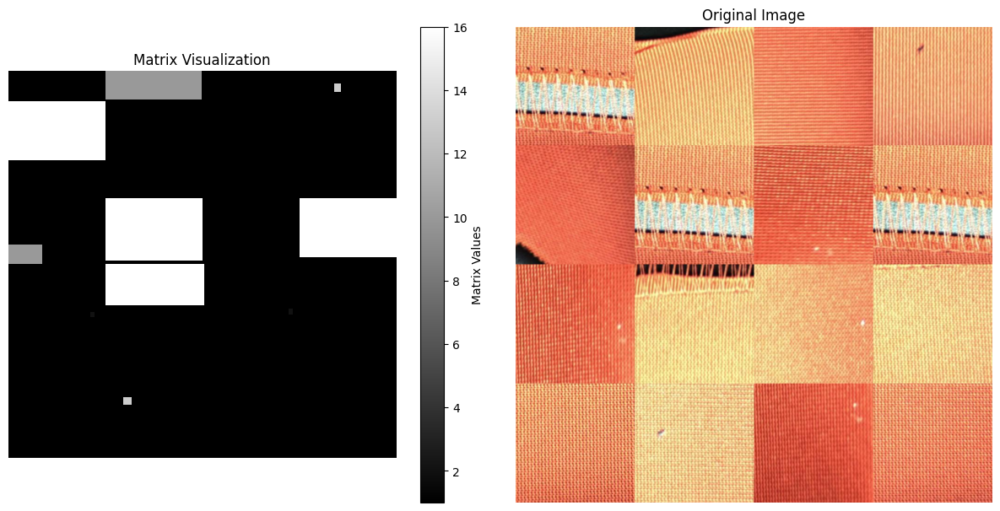

In [ ]:
def visualize_matrix_and_image(matrix_path, image_path):

    # Load the matrix
    matrix = np.load(matrix_path)
    print(f"Loaded matrix of shape: {matrix.shape}")

    # Load the original image
    original_image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if original_image is None:
        print(f"Error: Unable to load image from {image_path}")
        return

    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    print(f"Loaded image of shape: {original_image.shape}")

    # Create a figure to display both
    plt.figure(figsize=(12, 6))

    # Display the matrix
    plt.subplot(1, 2, 1)
    plt.imshow(matrix, cmap='gray', interpolation='nearest')
    plt.colorbar(label="Matrix Values")
    plt.title("Matrix Visualization")
    plt.axis('off')

    # Display the original image
    plt.subplot(1, 2, 2)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

matrix_path = '/content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test/collage_75_6_final_matrix.npy'
image_path = '/content/gdrive/MyDrive/Colab Notebooks/test/test/collage_75_6.jpg'
visualize_matrix_and_image(matrix_path, image_path)



In [ ]:
def draw_bounding_boxes(image, matrix, class_names, class_colors, reserved_ids={0, 1}):

    annotated_image = image.copy()

    # Get unique defect IDs (excluding reserved IDs)
    defect_ids = np.unique(matrix)
    defect_ids = [d for d in defect_ids if d not in reserved_ids]

    for defect_id in defect_ids:
        # Find connected components for the current defect
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats((matrix == defect_id).astype(np.uint8))

        for i in range(1, num_labels):
            x, y, w, h, _ = stats[i]
            if defect_id>=10:
              class_id = defect_id - 10  # Adjust ID to match class index
            else:
              class_id = defect_id
            class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown {class_id}"
            color = class_colors.get(class_id, (255, 255, 255))  # Default to white if color not defined

            # Draw bounding box and label
            cv2.rectangle(annotated_image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(annotated_image, class_name, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    return annotated_image

if __name__ == "__main__":
    image_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/test"
    matrix_folder = "/content/gdrive/MyDrive/Colab Notebooks/test/process folder/vgg_test"
    class_names = ["hole", "loose thread", "pinhole", "scratch", "small hole", "spot", "stitch defect"]

    # Assign colors to each class
    class_colors = {
        0: (255, 0, 0),       # Red for "hole"
        1: (0, 255, 0),       # Green for "loose thread"
        2: (255, 0, 255),     # Magenta for "pinhole"
        3: (0, 255, 255),     # Yellow for "scratch"
        4: (0, 0, 255),       # Blue for "small hole"
        5: (128, 0, 128),     # Purple for "spot"
        6: (255, 165, 0),     # Orange for "stitch defect"
    }

    # Exclude reserved IDs (e.g., 0: skipped defects, 1: good regions)
    reserved_ids = {0, 1}

    def show_image(image_name):
        # Derive paths for the image and matrix
        image_path = os.path.join(image_folder, image_name)
        matrix_name = image_name.replace(".jpg", "_final_matrix.npy")
        matrix_path = os.path.join(matrix_folder, matrix_name)

        if not os.path.exists(image_path) or not os.path.exists(matrix_path):
            print(f"Missing image or matrix for: {image_name}")
            return

        # Load image and matrix
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for proper display
        matrix = np.load(matrix_path)

        # Annotate image
        annotated_image = draw_bounding_boxes(image, matrix, class_names, class_colors, reserved_ids)

        # Display the annotated image
        plt.figure(figsize=(10, 10))
        plt.imshow(annotated_image)
        plt.axis("off")
        plt.title(f"Annotated Image: {image_name}")
        plt.show()


    image_names = [f for f in os.listdir(image_folder) if f.endswith(".jpg")]
    interact(show_image, image_name=image_names)


interactive(children=(Dropdown(description='image_name', options=('collage_4_2.jpg', 'collage_75_6.jpg', 'coll…